In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [7]:
importlib.reload(params) #####
importlib.reload(strategies) #####
df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()

for day, df_day in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    # df_actions = strategies.generate_trade_actions(
    #     df              = df_day,
    #     col_signal      = "ema_9",
    #     sign_thresh     = "ema_21",
    #     sellmin_idx     = params.sellmin_idx_tick,
    #     trailstop_pct   = params.trailstop_pct_tick,
    #     sess_start      = params.sess_start_tick
    # )
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/20 [00:00<?, ?it/s]

Loop finished. Days simulated: 20


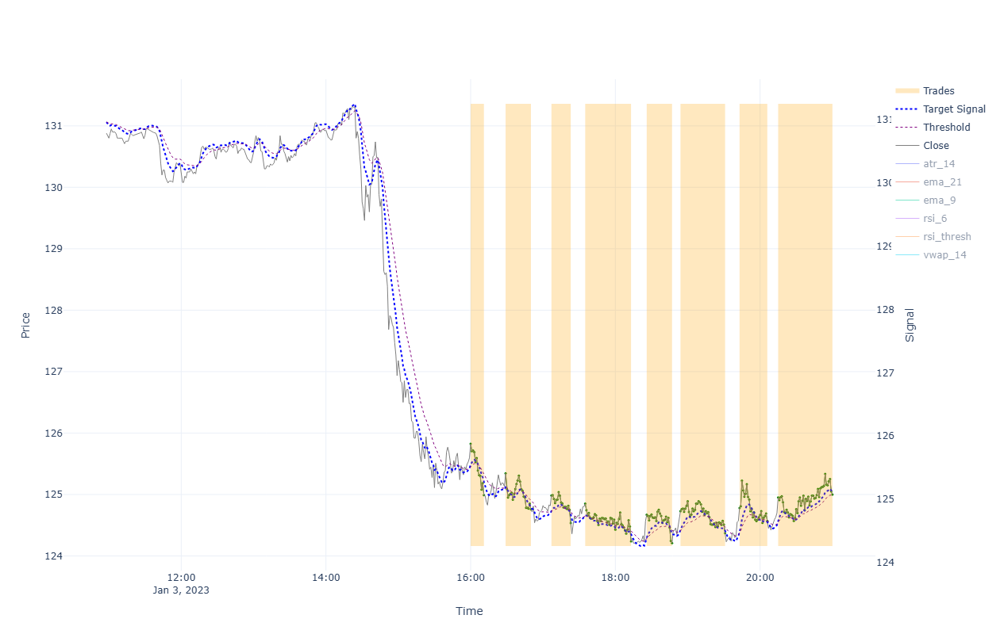


=== Performance for 2023-01-03 00:00:00 ===

BUY&HOLD:
  Bid(0) 124.975 - Ask(0) 129.786 - Fee(0) [0.004+0.021] = -4.836
TRADES:
  Bid(1) 124.965 - Ask(1) 125.85 - Fee(1) [0.004+0.021] = -0.911
  Bid(2) 124.734 - Ask(2) 125.37 - Fee(2) [0.004+0.021] = -0.661
  Bid(3) 124.51 - Ask(3) 125.01 - Fee(3) [0.004+0.021] = -0.525
  Bid(4) 124.215 - Ask(4) 124.875 - Fee(4) [0.004+0.021] = -0.685
  Bid(5) 124.185 - Ask(5) 124.695 - Fee(5) [0.004+0.021] = -0.535
  Bid(6) 124.345 - Ask(6) 124.755 - Fee(6) [0.004+0.021] = -0.435
  Bid(7) 124.545 - Ask(7) 124.805 - Fee(7) [0.004+0.021] = -0.285
  Bid(8) 124.975 - Ask(8) 124.975 - Fee(8) [0.004+0.0] = -0.004
STRATEGY:
  Trade(1) -0.911 + Trade(2) -0.661 + Trade(3) -0.525 + Trade(4) -0.685 + Trade(5) -0.535 + Trade(6) -0.435 + Trade(7) -0.285 + Trade(8) -0.004 = -4.041

------------------------------------------------------------------------------------------------------------------------



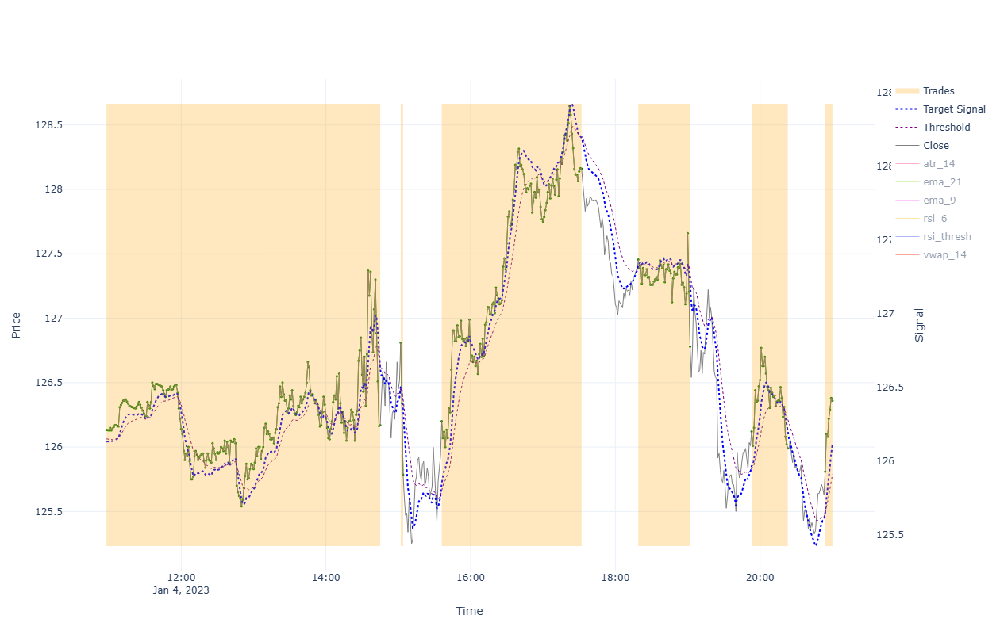


=== Performance for 2023-01-04 00:00:00 ===

BUY&HOLD:
  Bid(0) 126.335 - Ask(0) 126.587 - Fee(0) [0.004+0.022] = -0.278
TRADES:
  Bid(1) 126.145 - Ask(1) 124.975 - Fee(1) [0.0+0.022] = 1.148
  Bid(2) 125.76 - Ask(2) 126.835 - Fee(2) [0.004+0.022] = -1.101
  Bid(3) 128.134 - Ask(3) 126.225 - Fee(3) [0.004+0.022] = 1.883
  Bid(4) 126.755 - Ask(4) 127.48 - Fee(4) [0.004+0.022] = -0.752
  Bid(5) 125.965 - Ask(5) 126.145 - Fee(5) [0.004+0.022] = -0.206
  Bid(6) 126.335 - Ask(6) 125.835 - Fee(6) [0.004+0.0] = 0.496
STRATEGY:
  Trade(1) 1.148 + Trade(2) -1.101 + Trade(3) 1.883 + Trade(4) -0.752 + Trade(5) -0.206 + Trade(6) 0.496 = 1.468

------------------------------------------------------------------------------------------------------------------------



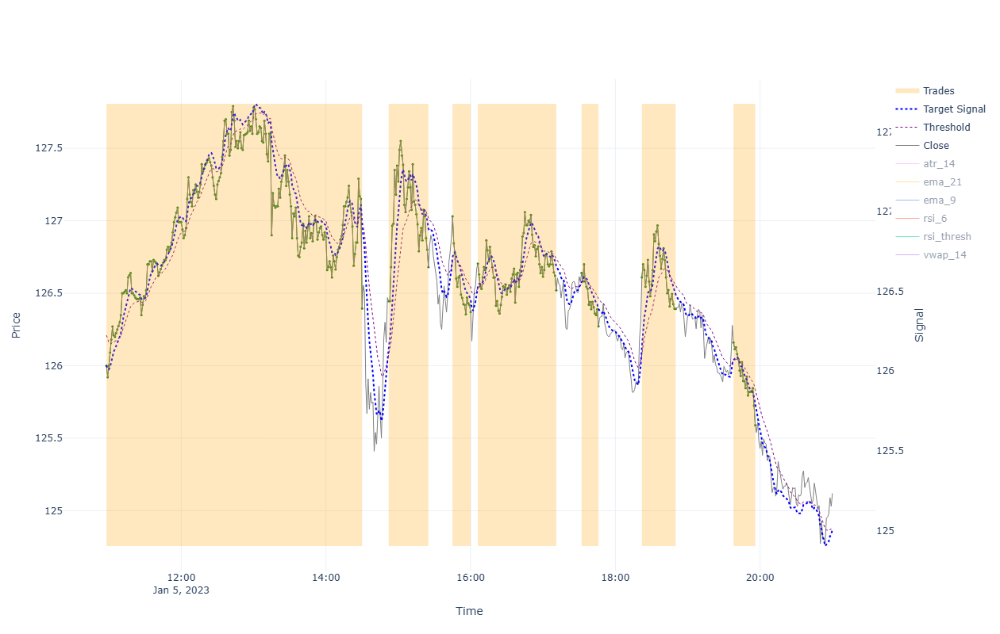


=== Performance for 2023-01-05 00:00:00 ===

BUY&HOLD:
  Bid(0) 125.095 - Ask(0) 126.42 - Fee(0) [0.004+0.021] = -1.351
TRADES:
  Bid(1) 126.37 - Ask(1) 126.335 - Fee(1) [0.0+0.022] = 0.013
  Bid(2) 126.655 - Ask(2) 126.47 - Fee(2) [0.004+0.022] = 0.159
  Bid(3) 126.345 - Ask(3) 127.055 - Fee(3) [0.004+0.022] = -0.736
  Bid(4) 126.495 - Ask(4) 126.729 - Fee(4) [0.004+0.022] = -0.26
  Bid(5) 126.246 - Ask(5) 126.665 - Fee(5) [0.004+0.022] = -0.445
  Bid(6) 126.367 - Ask(6) 126.635 - Fee(6) [0.004+0.022] = -0.294
  Bid(7) 125.565 - Ask(7) 126.185 - Fee(7) [0.004+0.022] = -0.646
STRATEGY:
  Trade(1) 0.013 + Trade(2) 0.159 + Trade(3) -0.736 + Trade(4) -0.26 + Trade(5) -0.445 + Trade(6) -0.294 + Trade(7) -0.646 = -2.209

------------------------------------------------------------------------------------------------------------------------



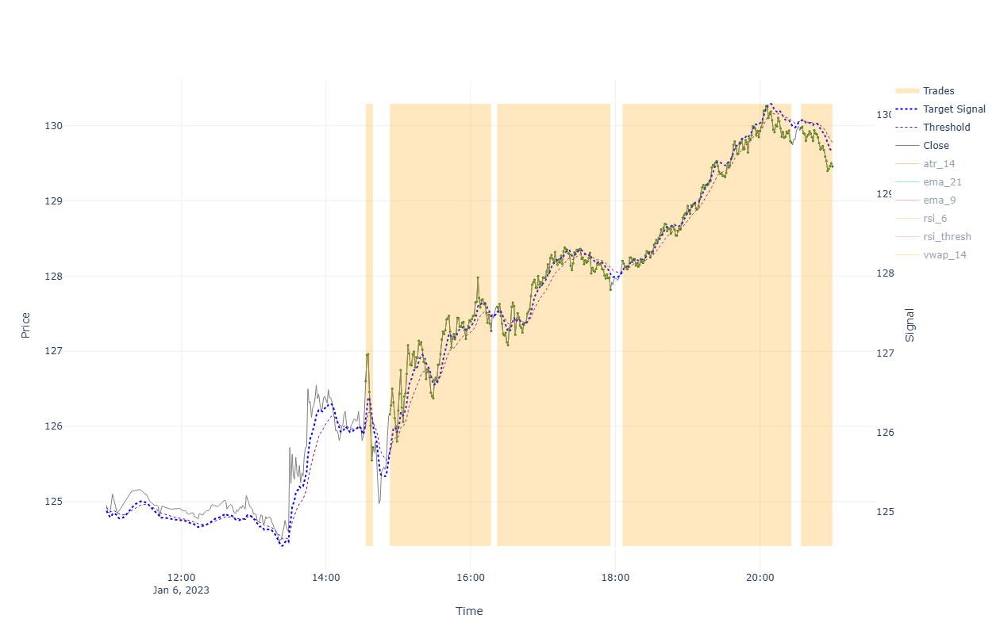


=== Performance for 2023-01-06 00:00:00 ===

BUY&HOLD:
  Bid(0) 129.434 - Ask(0) 125.835 - Fee(0) [0.004+0.022] = 3.573
TRADES:
  Bid(1) 125.695 - Ask(1) 126.626 - Fee(1) [0.004+0.022] = -0.957
  Bid(2) 127.245 - Ask(2) 126.185 - Fee(2) [0.004+0.022] = 1.034
  Bid(3) 127.794 - Ask(3) 127.615 - Fee(3) [0.004+0.022] = 0.153
  Bid(4) 129.749 - Ask(4) 128.228 - Fee(4) [0.004+0.022] = 1.495
  Bid(5) 129.434 - Ask(5) 129.996 - Fee(5) [0.004+0.0] = -0.566
STRATEGY:
  Trade(1) -0.957 + Trade(2) 1.034 + Trade(3) 0.153 + Trade(4) 1.495 + Trade(5) -0.566 = 1.159

------------------------------------------------------------------------------------------------------------------------



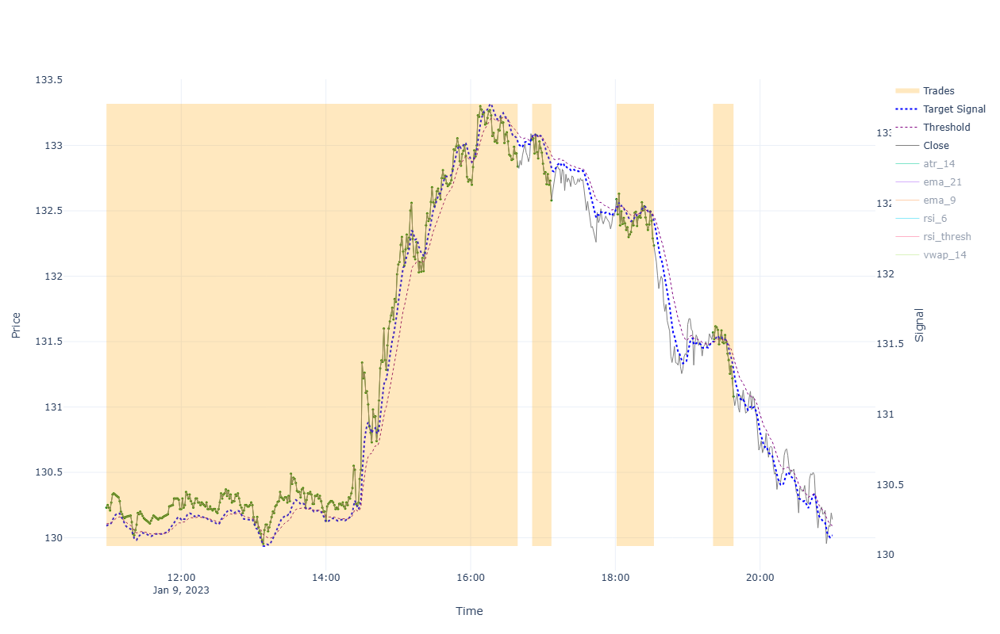


=== Performance for 2023-01-09 00:00:00 ===

BUY&HOLD:
  Bid(0) 130.114 - Ask(0) 131.366 - Fee(0) [0.004+0.022] = -1.278
TRADES:
  Bid(1) 132.813 - Ask(1) 129.434 - Fee(1) [0.0+0.023] = 3.357
  Bid(2) 132.554 - Ask(2) 133.071 - Fee(2) [0.004+0.022] = -0.544
  Bid(3) 132.209 - Ask(3) 132.617 - Fee(3) [0.004+0.022] = -0.434
  Bid(4) 131.054 - Ask(4) 131.596 - Fee(4) [0.004+0.022] = -0.569
STRATEGY:
  Trade(1) 3.357 + Trade(2) -0.544 + Trade(3) -0.434 + Trade(4) -0.569 = 1.81

------------------------------------------------------------------------------------------------------------------------



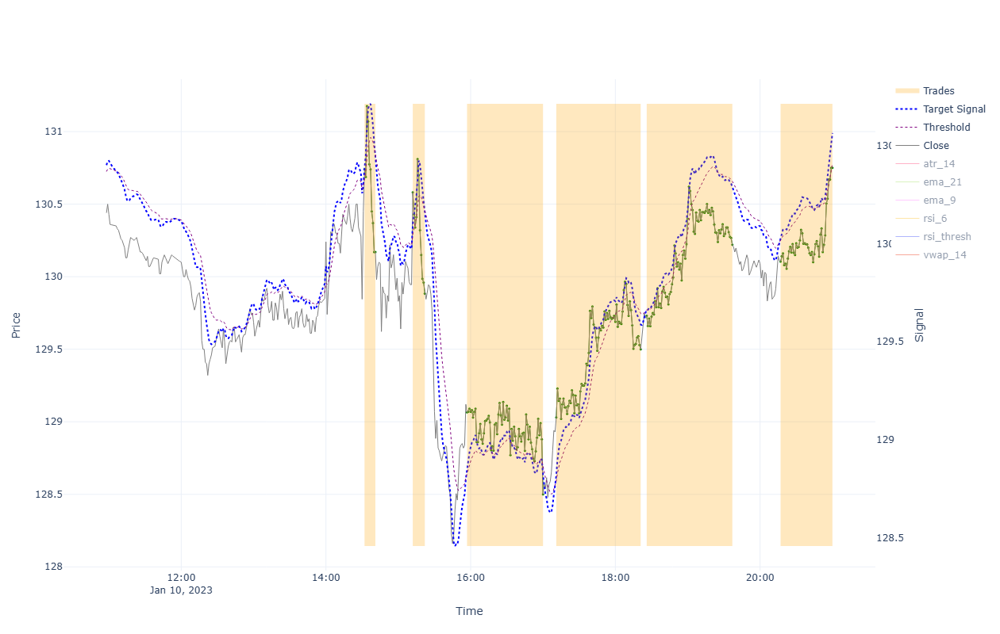


=== Performance for 2023-01-10 00:00:00 ===

BUY&HOLD:
  Bid(0) 130.724 - Ask(0) 129.871 - Fee(0) [0.004+0.022] = 0.827
TRADES:
  Bid(1) 130.144 - Ask(1) 130.766 - Fee(1) [0.004+0.022] = -0.648
  Bid(2) 129.858 - Ask(2) 130.608 - Fee(2) [0.004+0.022] = -0.776
  Bid(3) 128.474 - Ask(3) 129.091 - Fee(3) [0.004+0.022] = -0.642
  Bid(4) 129.474 - Ask(4) 129.056 - Fee(4) [0.004+0.022] = 0.392
  Bid(5) 130.194 - Ask(5) 129.756 - Fee(5) [0.004+0.022] = 0.412
  Bid(6) 130.724 - Ask(6) 130.131 - Fee(6) [0.004+0.0] = 0.589
STRATEGY:
  Trade(1) -0.648 + Trade(2) -0.776 + Trade(3) -0.642 + Trade(4) 0.392 + Trade(5) 0.412 + Trade(6) 0.589 = -0.673

------------------------------------------------------------------------------------------------------------------------



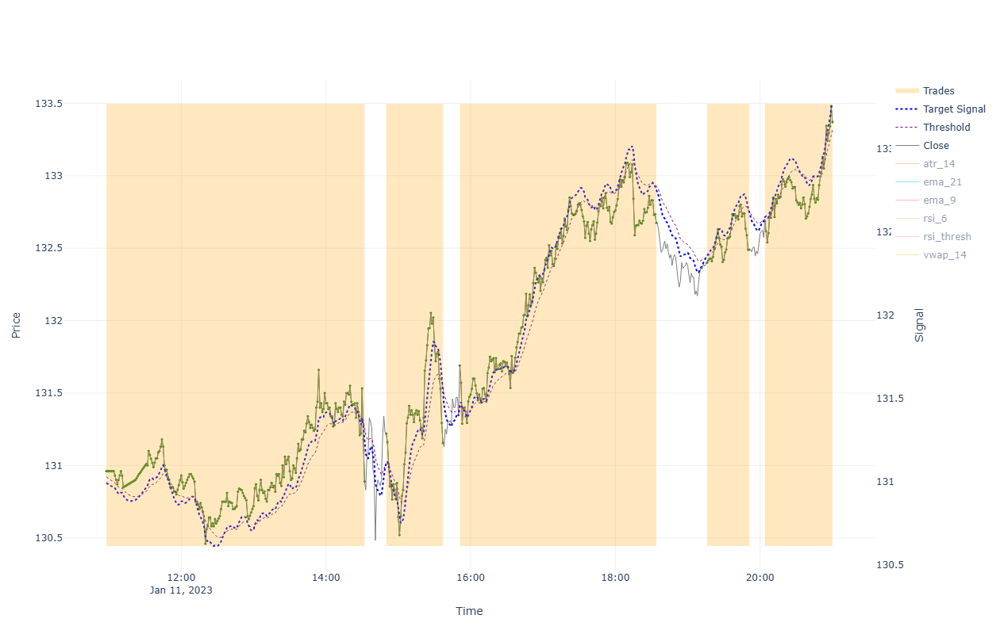


=== Performance for 2023-01-11 00:00:00 ===

BUY&HOLD:
  Bid(0) 133.343 - Ask(0) 131.559 - Fee(0) [0.004+0.023] = 1.758
TRADES:
  Bid(1) 130.864 - Ask(1) 130.724 - Fee(1) [0.0+0.022] = 0.118
  Bid(2) 131.129 - Ask(2) 131.246 - Fee(2) [0.004+0.022] = -0.144
  Bid(3) 132.648 - Ask(3) 131.716 - Fee(3) [0.004+0.022] = 0.906
  Bid(4) 132.464 - Ask(4) 132.426 - Fee(4) [0.004+0.022] = 0.011
  Bid(5) 133.343 - Ask(5) 132.712 - Fee(5) [0.004+0.0] = 0.627
STRATEGY:
  Trade(1) 0.118 + Trade(2) -0.144 + Trade(3) 0.906 + Trade(4) 0.011 + Trade(5) 0.627 = 1.518

------------------------------------------------------------------------------------------------------------------------



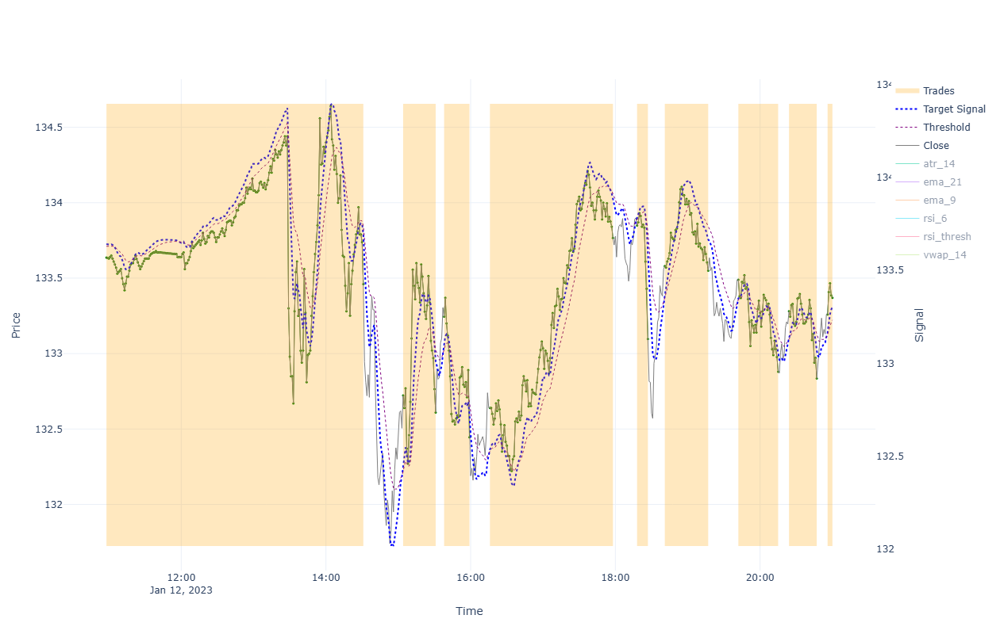


=== Performance for 2023-01-12 00:00:00 ===

BUY&HOLD:
  Bid(0) 133.343 - Ask(0) 133.766 - Fee(0) [0.004+0.023] = -0.449
TRADES:
  Bid(1) 133.433 - Ask(1) 133.343 - Fee(1) [0.0+0.023] = 0.067
  Bid(2) 132.583 - Ask(2) 132.748 - Fee(2) [0.004+0.022] = -0.191
  Bid(3) 132.419 - Ask(3) 133.272 - Fee(3) [0.004+0.022] = -0.88
  Bid(4) 133.739 - Ask(4) 132.667 - Fee(4) [0.004+0.023] = 1.046
  Bid(5) 133.07 - Ask(5) 133.876 - Fee(5) [0.004+0.023] = -0.832
  Bid(6) 133.524 - Ask(6) 133.607 - Fee(6) [0.004+0.023] = -0.11
  Bid(7) 132.854 - Ask(7) 133.517 - Fee(7) [0.004+0.023] = -0.689
  Bid(8) 132.808 - Ask(8) 133.307 - Fee(8) [0.004+0.023] = -0.525
  Bid(9) 133.343 - Ask(9) 133.287 - Fee(9) [0.004+0.0] = 0.053
STRATEGY:
  Trade(1) 0.067 + Trade(2) -0.191 + Trade(3) -0.88 + Trade(4) 1.046 + Trade(5) -0.832 + Trade(6) -0.11 + Trade(7) -0.689 + Trade(8) -0.525 + Trade(9) 0.053 = -2.061

-------------------------------------------------------------------------------------------------------------

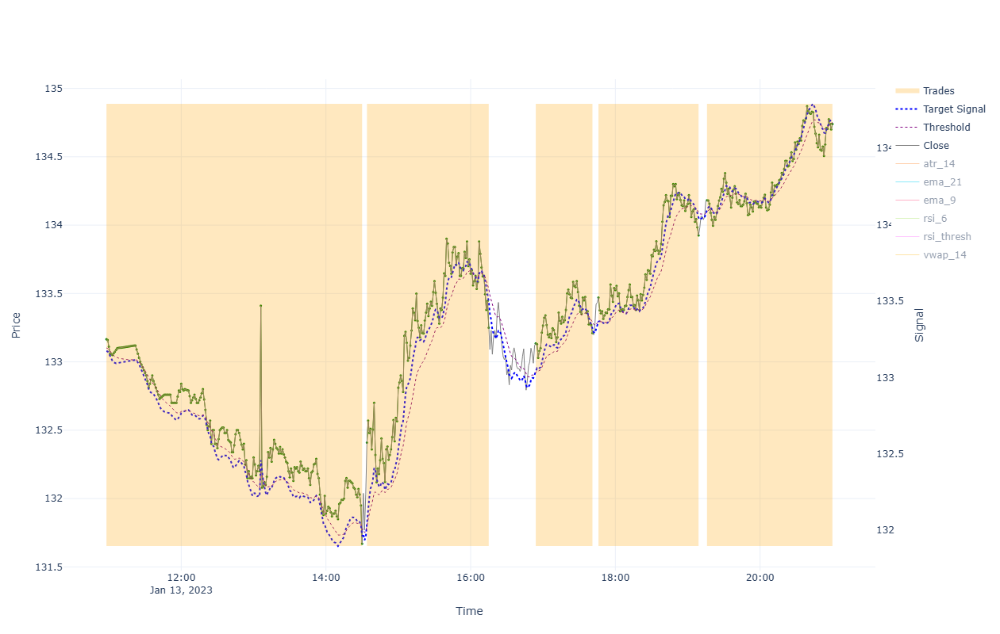


=== Performance for 2023-01-13 00:00:00 ===

BUY&HOLD:
  Bid(0) 134.713 - Ask(0) 131.696 - Fee(0) [0.004+0.023] = 2.99
TRADES:
  Bid(1) 131.644 - Ask(1) 133.343 - Fee(1) [0.0+0.022] = -1.722
  Bid(2) 133.223 - Ask(2) 132.436 - Fee(2) [0.004+0.023] = 0.76
  Bid(3) 133.183 - Ask(3) 133.162 - Fee(3) [0.004+0.023] = -0.005
  Bid(4) 133.898 - Ask(4) 133.497 - Fee(4) [0.004+0.023] = 0.375
  Bid(5) 134.713 - Ask(5) 134.208 - Fee(5) [0.004+0.0] = 0.501
STRATEGY:
  Trade(1) -1.722 + Trade(2) 0.76 + Trade(3) -0.005 + Trade(4) 0.375 + Trade(5) 0.501 = -0.091

------------------------------------------------------------------------------------------------------------------------



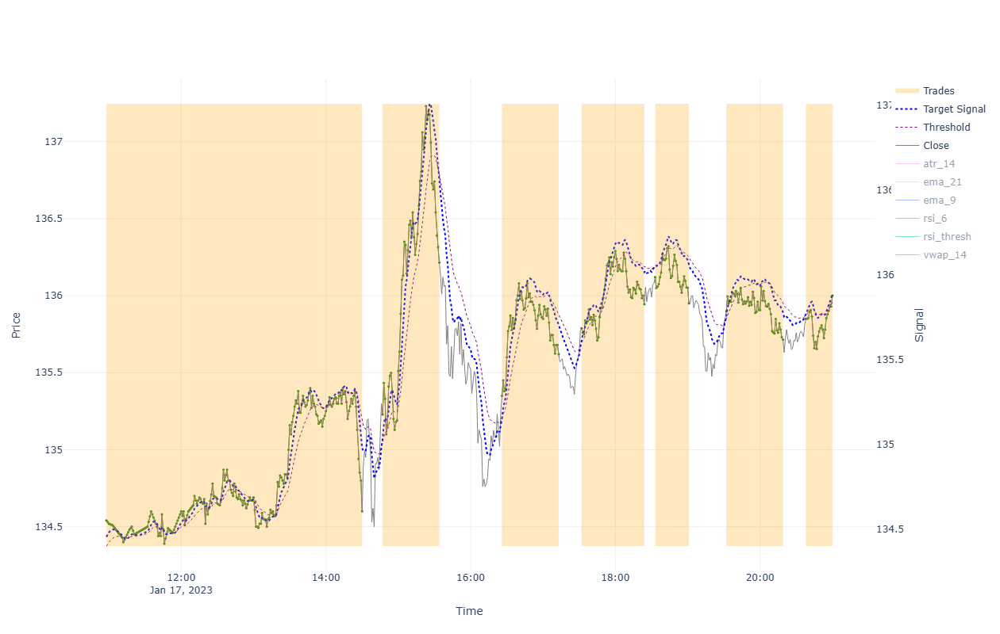


=== Performance for 2023-01-17 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.973 - Ask(0) 134.628 - Fee(0) [0.004+0.023] = 1.317
TRADES:
  Bid(1) 134.575 - Ask(1) 134.713 - Fee(1) [0.0+0.023] = -0.161
  Bid(2) 136.188 - Ask(2) 135.255 - Fee(2) [0.004+0.023] = 0.906
  Bid(3) 135.593 - Ask(3) 135.377 - Fee(3) [0.004+0.023] = 0.189
  Bid(4) 135.918 - Ask(4) 135.815 - Fee(4) [0.004+0.023] = 0.076
  Bid(5) 135.923 - Ask(5) 136.147 - Fee(5) [0.004+0.023] = -0.251
  Bid(6) 135.688 - Ask(6) 135.924 - Fee(6) [0.004+0.023] = -0.263
  Bid(7) 135.973 - Ask(7) 135.877 - Fee(7) [0.004+0.0] = 0.092
STRATEGY:
  Trade(1) -0.161 + Trade(2) 0.906 + Trade(3) 0.189 + Trade(4) 0.076 + Trade(5) -0.251 + Trade(6) -0.263 + Trade(7) 0.092 = 0.588

------------------------------------------------------------------------------------------------------------------------



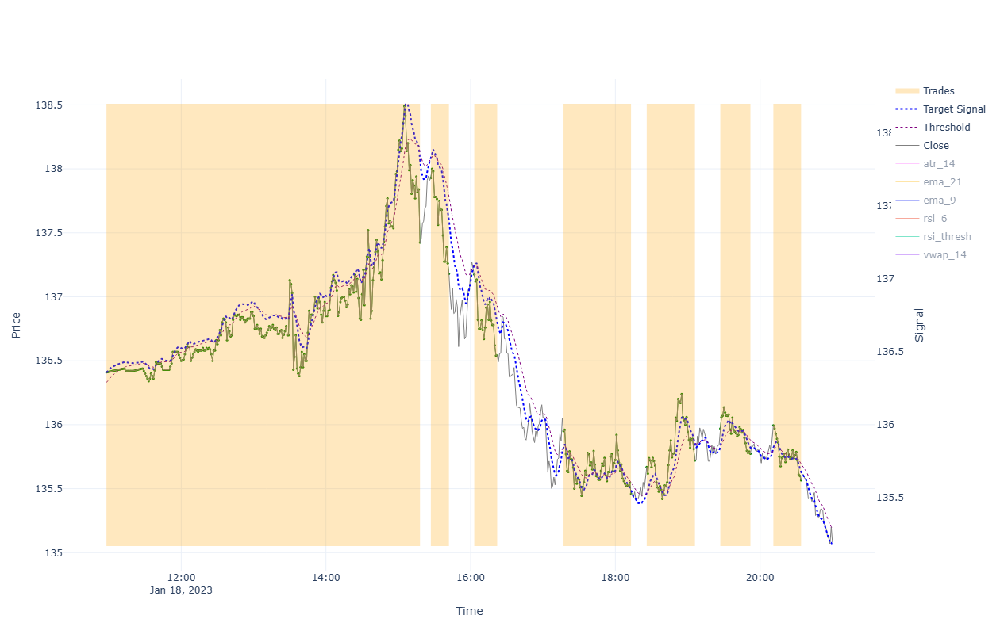


=== Performance for 2023-01-18 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.053 - Ask(0) 137.047 - Fee(0) [0.004+0.023] = -2.021
TRADES:
  Bid(1) 137.397 - Ask(1) 135.973 - Fee(1) [0.0+0.023] = 1.401
  Bid(2) 137.153 - Ask(2) 137.958 - Fee(2) [0.004+0.023] = -0.832
  Bid(3) 136.513 - Ask(3) 137.202 - Fee(3) [0.004+0.023] = -0.717
  Bid(4) 135.433 - Ask(4) 135.977 - Fee(4) [0.004+0.023] = -0.571
  Bid(5) 135.693 - Ask(5) 135.697 - Fee(5) [0.004+0.023] = -0.031
  Bid(6) 135.746 - Ask(6) 135.997 - Fee(6) [0.004+0.023] = -0.278
  Bid(7) 135.539 - Ask(7) 136.022 - Fee(7) [0.004+0.023] = -0.51
STRATEGY:
  Trade(1) 1.401 + Trade(2) -0.832 + Trade(3) -0.717 + Trade(4) -0.571 + Trade(5) -0.031 + Trade(6) -0.278 + Trade(7) -0.51 = -1.538

------------------------------------------------------------------------------------------------------------------------



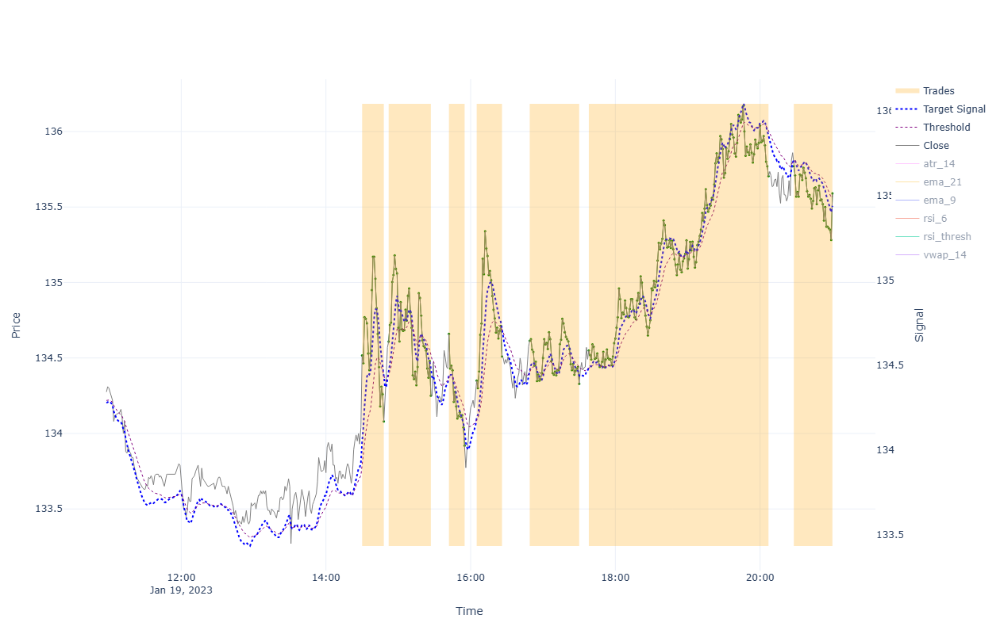


=== Performance for 2023-01-19 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.563 - Ask(0) 134.544 - Fee(0) [0.004+0.023] = 0.992
TRADES:
  Bid(1) 134.053 - Ask(1) 134.544 - Fee(1) [0.004+0.023] = -0.517
  Bid(2) 134.223 - Ask(2) 134.635 - Fee(2) [0.004+0.023] = -0.439
  Bid(3) 133.893 - Ask(3) 134.687 - Fee(3) [0.004+0.023] = -0.82
  Bid(4) 134.483 - Ask(4) 134.377 - Fee(4) [0.004+0.023] = 0.079
  Bid(5) 134.302 - Ask(5) 134.641 - Fee(5) [0.004+0.023] = -0.367
  Bid(6) 135.678 - Ask(6) 134.577 - Fee(6) [0.004+0.023] = 1.074
  Bid(7) 135.563 - Ask(7) 135.797 - Fee(7) [0.004+0.0] = -0.238
STRATEGY:
  Trade(1) -0.517 + Trade(2) -0.439 + Trade(3) -0.82 + Trade(4) 0.079 + Trade(5) -0.367 + Trade(6) 1.074 + Trade(7) -0.238 = -1.228

------------------------------------------------------------------------------------------------------------------------



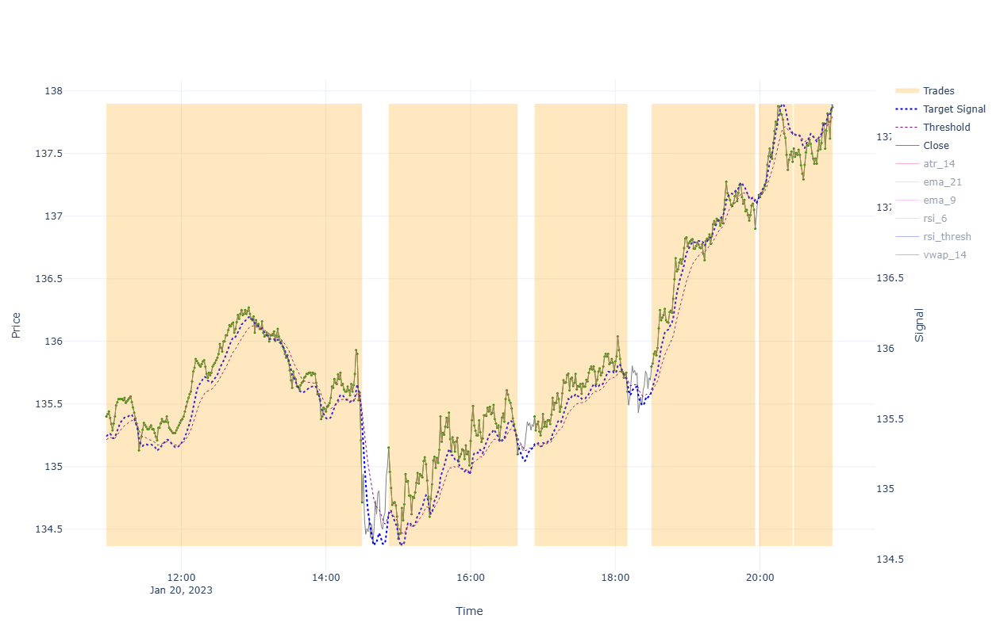


=== Performance for 2023-01-20 00:00:00 ===

BUY&HOLD:
  Bid(0) 137.842 - Ask(0) 134.742 - Fee(0) [0.004+0.023] = 3.073
TRADES:
  Bid(1) 134.688 - Ask(1) 135.563 - Fee(1) [0.0+0.023] = -0.898
  Bid(2) 135.073 - Ask(2) 135.179 - Fee(2) [0.004+0.023] = -0.133
  Bid(3) 135.573 - Ask(3) 135.427 - Fee(3) [0.004+0.023] = 0.119
  Bid(4) 136.873 - Ask(4) 135.827 - Fee(4) [0.004+0.023] = 1.018
  Bid(5) 137.408 - Ask(5) 137.197 - Fee(5) [0.004+0.023] = 0.183
  Bid(6) 137.842 - Ask(6) 137.567 - Fee(6) [0.004+0.0] = 0.271
STRATEGY:
  Trade(1) -0.898 + Trade(2) -0.133 + Trade(3) 0.119 + Trade(4) 1.018 + Trade(5) 0.183 + Trade(6) 0.271 = 0.56

------------------------------------------------------------------------------------------------------------------------



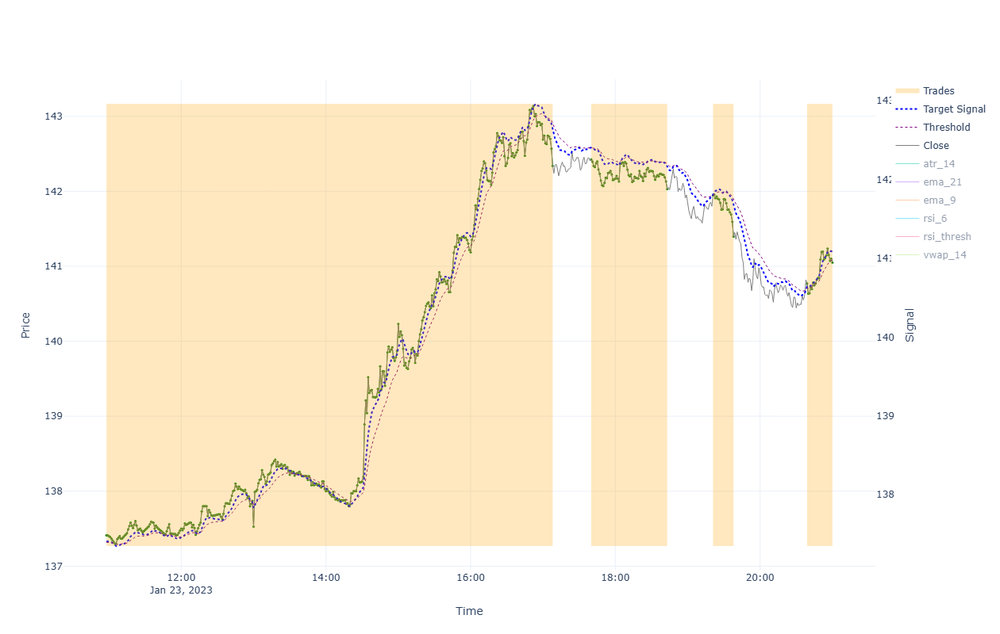


=== Performance for 2023-01-23 00:00:00 ===

BUY&HOLD:
  Bid(0) 141.022 - Ask(0) 138.158 - Fee(0) [0.004+0.024] = 2.837
TRADES:
  Bid(1) 142.312 - Ask(1) 137.842 - Fee(1) [0.0+0.024] = 4.445
  Bid(2) 142.001 - Ask(2) 142.453 - Fee(2) [0.004+0.024] = -0.48
  Bid(3) 141.367 - Ask(3) 141.973 - Fee(3) [0.004+0.024] = -0.634
  Bid(4) 141.022 - Ask(4) 140.798 - Fee(4) [0.004+0.0] = 0.22
STRATEGY:
  Trade(1) 4.445 + Trade(2) -0.48 + Trade(3) -0.634 + Trade(4) 0.22 = 3.551

------------------------------------------------------------------------------------------------------------------------



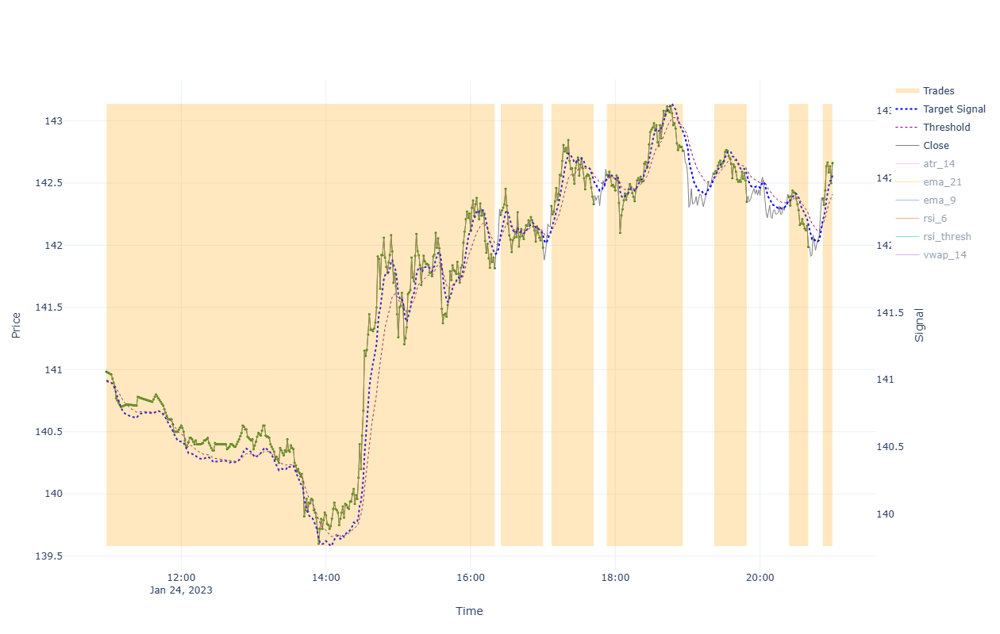


=== Performance for 2023-01-24 00:00:00 ===

BUY&HOLD:
  Bid(0) 142.631 - Ask(0) 140.498 - Fee(0) [0.004+0.024] = 2.105
TRADES:
  Bid(1) 141.787 - Ask(1) 141.022 - Fee(1) [0.0+0.024] = 0.742
  Bid(2) 141.952 - Ask(2) 142.273 - Fee(2) [0.004+0.024] = -0.35
  Bid(3) 142.302 - Ask(3) 142.343 - Fee(3) [0.004+0.024] = -0.07
  Bid(4) 142.731 - Ask(4) 142.594 - Fee(4) [0.004+0.024] = 0.11
  Bid(5) 142.322 - Ask(5) 142.604 - Fee(5) [0.004+0.024] = -0.31
  Bid(6) 141.959 - Ask(6) 142.418 - Fee(6) [0.004+0.024] = -0.487
  Bid(7) 142.631 - Ask(7) 142.403 - Fee(7) [0.004+0.0] = 0.224
STRATEGY:
  Trade(1) 0.742 + Trade(2) -0.35 + Trade(3) -0.07 + Trade(4) 0.11 + Trade(5) -0.31 + Trade(6) -0.487 + Trade(7) 0.224 = -0.141

------------------------------------------------------------------------------------------------------------------------



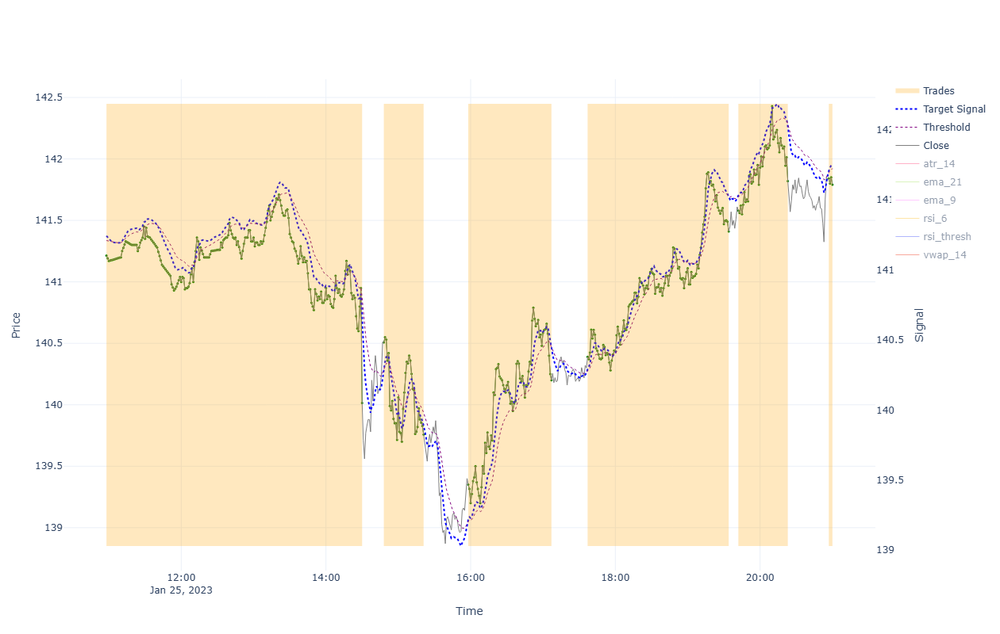


=== Performance for 2023-01-25 00:00:00 ===

BUY&HOLD:
  Bid(0) 141.762 - Ask(0) 140.043 - Fee(0) [0.004+0.024] = 1.691
TRADES:
  Bid(1) 139.987 - Ask(1) 142.631 - Fee(1) [0.0+0.024] = -2.668
  Bid(2) 139.73 - Ask(2) 140.535 - Fee(2) [0.004+0.023] = -0.832
  Bid(3) 140.172 - Ask(3) 139.378 - Fee(3) [0.004+0.024] = 0.767
  Bid(4) 141.382 - Ask(4) 140.418 - Fee(4) [0.004+0.024] = 0.936
  Bid(5) 141.792 - Ask(5) 141.608 - Fee(5) [0.004+0.024] = 0.155
  Bid(6) 141.762 - Ask(6) 141.868 - Fee(6) [0.004+0.0] = -0.111
STRATEGY:
  Trade(1) -2.668 + Trade(2) -0.832 + Trade(3) 0.767 + Trade(4) 0.936 + Trade(5) 0.155 + Trade(6) -0.111 = -1.753

------------------------------------------------------------------------------------------------------------------------



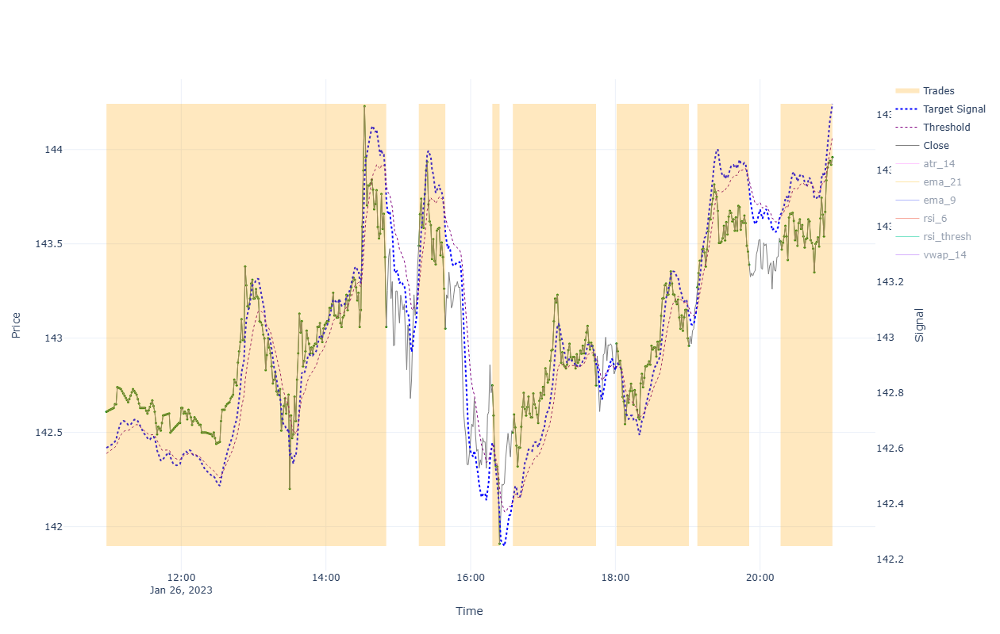


=== Performance for 2023-01-26 00:00:00 ===

BUY&HOLD:
  Bid(0) 143.931 - Ask(0) 143.62 - Fee(0) [0.004+0.024] = 0.283
TRADES:
  Bid(1) 143.031 - Ask(1) 141.762 - Fee(1) [0.0+0.024] = 1.246
  Bid(2) 143.022 - Ask(2) 143.519 - Fee(2) [0.004+0.024] = -0.524
  Bid(3) 141.882 - Ask(3) 142.779 - Fee(3) [0.004+0.024] = -0.925
  Bid(4) 142.721 - Ask(4) 142.529 - Fee(4) [0.004+0.024] = 0.165
  Bid(5) 142.931 - Ask(5) 143.0 - Fee(5) [0.004+0.024] = -0.097
  Bid(6) 143.361 - Ask(6) 143.299 - Fee(6) [0.004+0.024] = 0.035
  Bid(7) 143.931 - Ask(7) 143.543 - Fee(7) [0.004+0.0] = 0.384
STRATEGY:
  Trade(1) 1.246 + Trade(2) -0.524 + Trade(3) -0.925 + Trade(4) 0.165 + Trade(5) -0.097 + Trade(6) 0.035 + Trade(7) 0.384 = 0.284

------------------------------------------------------------------------------------------------------------------------



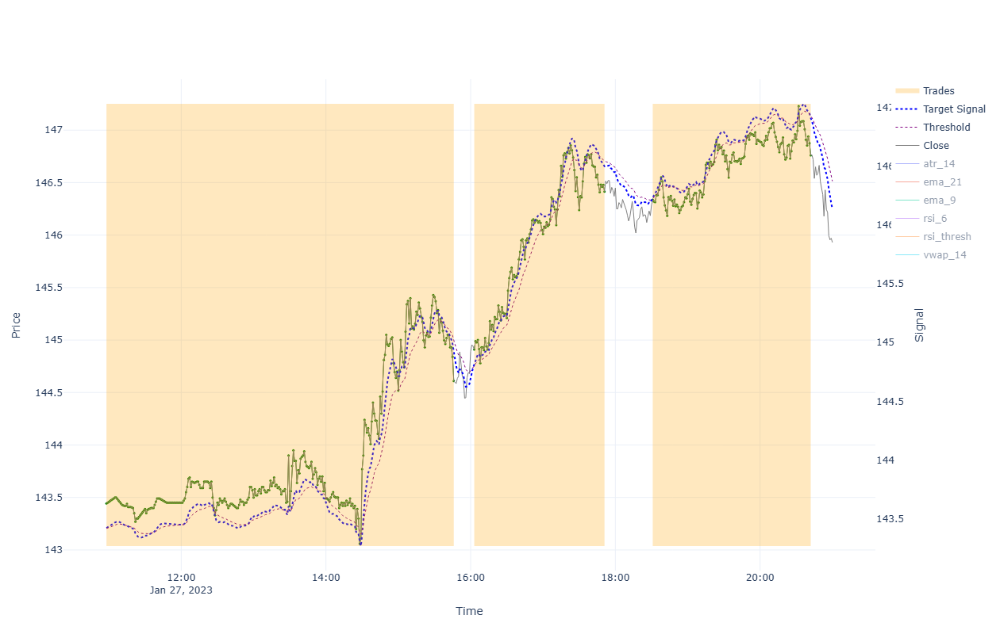


=== Performance for 2023-01-27 00:00:00 ===

BUY&HOLD:
  Bid(0) 145.901 - Ask(0) 143.799 - Fee(0) [0.004+0.024] = 2.074
TRADES:
  Bid(1) 144.581 - Ask(1) 143.931 - Fee(1) [0.0+0.024] = 0.626
  Bid(2) 146.386 - Ask(2) 144.939 - Fee(2) [0.004+0.024] = 1.418
  Bid(3) 146.731 - Ask(3) 146.366 - Fee(3) [0.004+0.024] = 0.336
STRATEGY:
  Trade(1) 0.626 + Trade(2) 1.418 + Trade(3) 0.336 = 2.38

------------------------------------------------------------------------------------------------------------------------



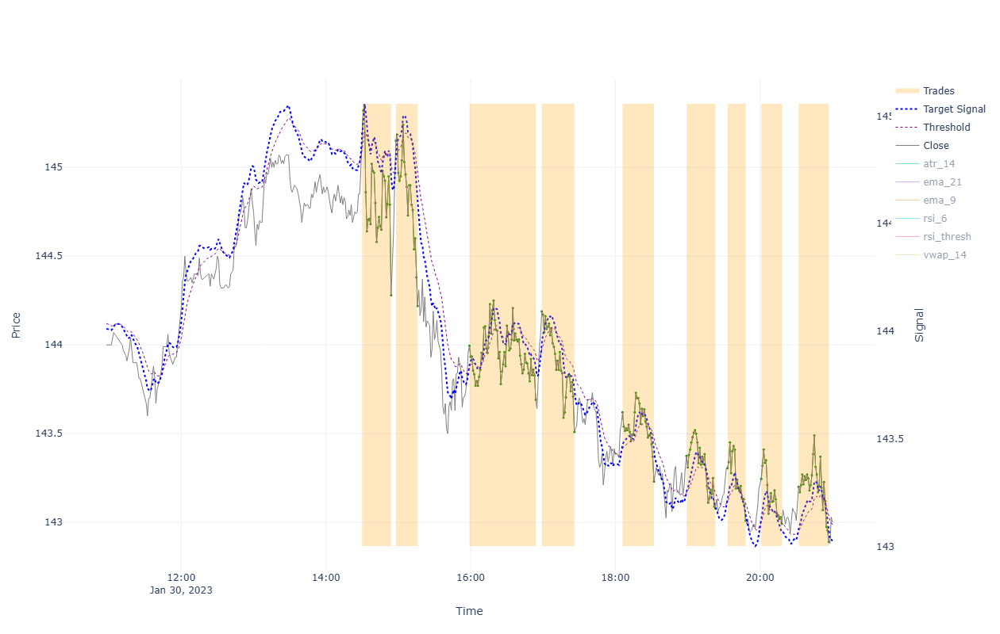


=== Performance for 2023-01-30 00:00:00 ===

BUY&HOLD:
  Bid(0) 142.971 - Ask(0) 145.219 - Fee(0) [0.004+0.024] = -2.276
TRADES:
  Bid(1) 144.251 - Ask(1) 145.219 - Fee(1) [0.004+0.024] = -0.996
  Bid(2) 144.191 - Ask(2) 145.179 - Fee(2) [0.004+0.024] = -1.016
  Bid(3) 143.661 - Ask(3) 144.024 - Fee(3) [0.004+0.024] = -0.391
  Bid(4) 143.481 - Ask(4) 144.217 - Fee(4) [0.004+0.024] = -0.764
  Bid(5) 143.201 - Ask(5) 143.649 - Fee(5) [0.004+0.024] = -0.475
  Bid(6) 143.051 - Ask(6) 143.404 - Fee(6) [0.004+0.024] = -0.38
  Bid(7) 142.981 - Ask(7) 143.334 - Fee(7) [0.004+0.024] = -0.38
  Bid(8) 142.965 - Ask(8) 143.274 - Fee(8) [0.004+0.024] = -0.337
  Bid(9) 142.861 - Ask(9) 143.229 - Fee(9) [0.004+0.024] = -0.395
STRATEGY:
  Trade(1) -0.996 + Trade(2) -1.016 + Trade(3) -0.391 + Trade(4) -0.764 + Trade(5) -0.475 + Trade(6) -0.38 + Trade(7) -0.38 + Trade(8) -0.337 + Trade(9) -0.395 = -5.134

--------------------------------------------------------------------------------------------------

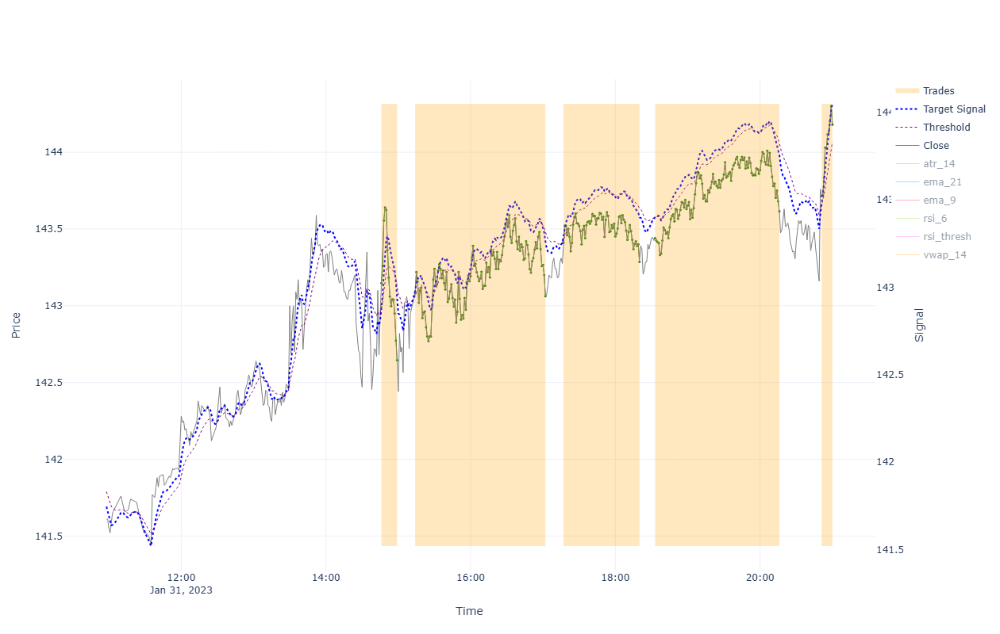


=== Performance for 2023-01-31 00:00:00 ===

BUY&HOLD:
  Bid(0) 144.151 - Ask(0) 142.498 - Fee(0) [0.004+0.024] = 1.625
TRADES:
  Bid(1) 142.617 - Ask(1) 143.177 - Fee(1) [0.004+0.024] = -0.587
  Bid(2) 143.034 - Ask(2) 143.109 - Fee(2) [0.004+0.024] = -0.103
  Bid(3) 143.256 - Ask(3) 143.439 - Fee(3) [0.004+0.024] = -0.21
  Bid(4) 143.585 - Ask(4) 143.469 - Fee(4) [0.004+0.024] = 0.089
  Bid(5) 144.151 - Ask(5) 143.744 - Fee(5) [0.004+0.0] = 0.403
STRATEGY:
  Trade(1) -0.587 + Trade(2) -0.103 + Trade(3) -0.21 + Trade(4) 0.089 + Trade(5) 0.403 = -0.408

------------------------------------------------------------------------------------------------------------------------


Overall Summary (2023-01-03 = 130.906 → 2023-01-31 = 144.151)
Num. trading days: 20
Trades Count: 123

One-Time B&H gain: 13.245
Sum Strategy gain: -5.959
Sum Intraday B&H gain: 12.656

One-Time B&H gain per day: 0.6622
Strategy gain per day: -0.2980
Strategy gain per trade: -0.0484


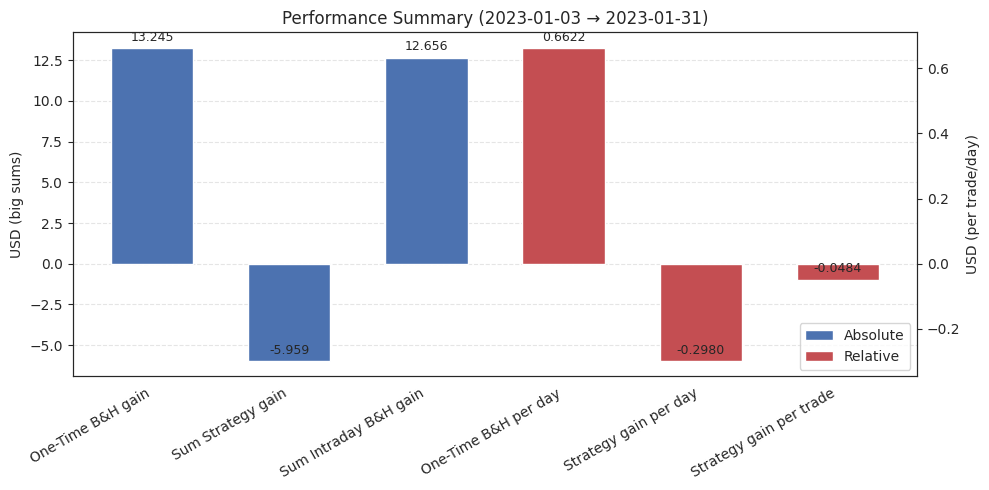


Overall Summary (2023-01-03 = 130.906 → 2023-01-31 = 144.151)
Num. trading days: 20
Trades Count: 123

One-Time B&H gain: 13.245
Sum Strategy gain: -5.959
Sum Intraday B&H gain: 12.656

One-Time B&H gain per day: 0.6622
Strategy gain per day: -0.2980
Strategy gain per trade: -0.0484


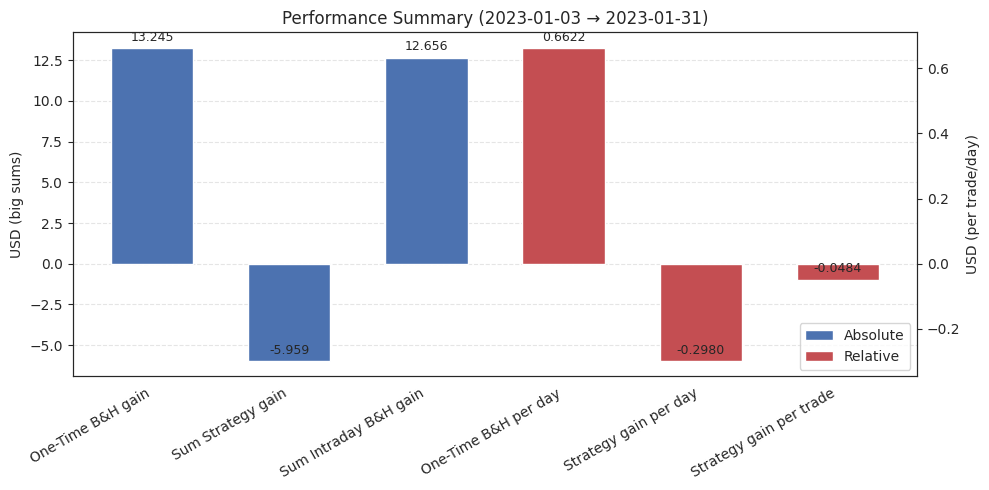

In [8]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day,
            col_signal1        = "ema_9",
            sign_thresh        = "ema_21", 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14'], 
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df_inds_test)


In [6]:
import pandas as pd

day = pd.Timestamp("2023-01-05")
rng = slice(day + pd.Timedelta(hours=14, minutes=25), day + pd.Timedelta(hours=14, minutes=35))

# 1) df_sim for the day (if present)
print("=== df_sim rows 14:25-14:35 ===")
if day in sim_results:
    df_sim_day = sim_results[day][0]
    if not df_sim_day.loc[rng].empty:
        print(df_sim_day.loc[rng, ["Position","Action","TradedAmount"]].to_string())
    else:
        print(" no rows in df_sim for that window")
else:
    print(" no sim_results entry for", day)

# 2) df_actions generator output for the same window
print("\n=== df_actions rows 14:25-14:35 ===")
if "df_actions" in globals():
    sub = df_actions.loc[rng, ["bid","ask","action"]]
    if not sub.empty:
        print(sub.to_string())
    else:
        print(" no rows in df_actions for that window")
else:
    print(" df_actions not found in globals()")

# 3) simulator start position and all trades for the day
print("\n=== simulator start row, start Position, and trades ===")
if day in sim_results:
    df_sim_day, trades_day, perf_day = sim_results[day]
    print("sim start index:", df_sim_day.index[0])
    print("sim start Position:", df_sim_day.iloc[0]["Position"])
    print("\nTrades (entry_ts -> exit_ts | entry_price -> exit_price):")
    if trades_day:
        for i, tr in enumerate(trades_day, 1):
            (entry_ts, exit_ts), (entry_p, exit_p), pct, buy_fee, sell_fee = tr
            print(i, entry_ts, "->", exit_ts, "|", _r3(entry_p) if ' _r3' in globals() else entry_p, "->", _r3(exit_p) if ' _r3' in globals() else exit_p, "| pct:", pct)
    else:
        print(" no trades recorded for this day")
else:
    print(" no sim_results entry for", day)


=== df_sim rows 14:25-14:35 ===
                     Position Action  TradedAmount
2023-01-05 14:25:00       1.0   Hold           0.0
2023-01-05 14:26:00       1.0   Hold           0.0
2023-01-05 14:27:00       1.0   Hold           0.0
2023-01-05 14:28:00       1.0   Hold           0.0
2023-01-05 14:29:00       1.0   Hold           0.0
2023-01-05 14:30:00       0.0   Sell          -1.0
2023-01-05 14:31:00       0.0   Hold           0.0
2023-01-05 14:32:00       0.0   Hold           0.0
2023-01-05 14:33:00       0.0   Hold           0.0
2023-01-05 14:34:00       0.0   Hold           0.0
2023-01-05 14:35:00       0.0   Hold           0.0

=== df_actions rows 14:25-14:35 ===
 no rows in df_actions for that window

=== simulator start row, start Position, and trades ===
sim start index: 2023-01-05 10:58:00
sim start Position: 1.0

Trades (entry_ts -> exit_ts | entry_price -> exit_price):
1 2023-01-05 10:58:00 -> 2023-01-05 14:30:00 | 126.334728 -> 126.369721 | pct: 0.028
2 2023-01-05 14:52